In [30]:
# Basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
import joblib
%matplotlib inline

In [31]:
# Load datasets (adjust paths if needed)
df_dos = pd.read_csv(r'D:\RawData-20251206T072629Z-3-001\RawData\Dos-Drone\dos1.csv')
df_malfuction = pd.read_csv(r'D:\RawData-20251206T072629Z-3-001\RawData\Malfunction-Drone\malfunction1.csv')
df_normal = pd.read_csv(r'D:\RawData-20251206T072629Z-3-001\RawData\NormalFlight\normal1.csv')
print('Loaded shapes:')
print('Dos:', df_dos.shape)
print('Malfunction:', df_malfuction.shape)
print('Normal:', df_normal.shape)

Loaded shapes:
Dos: (17204, 79)
Malfunction: (9040, 79)
Normal: (11599, 79)


In [32]:
# Quick columns check
print('Number of columns: dos={}, mal={}, normal={}'.format(len(df_dos.columns), len(df_malfuction.columns), len(df_normal.columns)))
print('Do columns match exactly (dos vs mal):', all(df_malfuction.columns == df_dos.columns))
print('Do columns match exactly (dos vs normal):', all(df_normal.columns == df_dos.columns))
# Show first 3 columns and types to inspect potential non-numeric fields
print('df_dos.head(2)Dos columns sample and dtypes:', df_dos.dtypes.head(10))

Number of columns: dos=79, mal=79, normal=79
Do columns match exactly (dos vs mal): True
Do columns match exactly (dos vs normal): True
df_dos.head(2)Dos columns sample and dtypes: S.No                                       int64
setpoint_raw-global_Time                 float64
setpoint_raw-global_header.seq             int64
setpoint_raw-global_header.stamp.secs      int64
setpoint_raw-global_latitude             float64
setpoint_raw-global_longitude            float64
setpoint_raw-global_altitude             float64
battery_Time                             float64
battery_header.seq                       float64
battery_header.stamp.secs                float64
dtype: object


In [33]:
df_normal['label'] = 'Normal'
df_dos['label'] = 'DoS_Attack'
df_malfuction['label'] = 'Malfunction'
print(df_dos.columns)

Index(['S.No', 'setpoint_raw-global_Time', 'setpoint_raw-global_header.seq',
       'setpoint_raw-global_header.stamp.secs', 'setpoint_raw-global_latitude',
       'setpoint_raw-global_longitude', 'setpoint_raw-global_altitude',
       'battery_Time', 'battery_header.seq', 'battery_header.stamp.secs',
       'battery_voltage', 'battery_current', 'battery_temperature',
       'battery_percentage', 'global_position-local_Time',
       'global_position-local_header.seq',
       'global_position-local_header.stamp.secs',
       'global_position-local_pose.pose.position.x',
       'global_position-local_pose.pose.position.y',
       'global_position-local_pose.pose.position.z',
       'global_position-local_pose.pose.orientation.x',
       'global_position-local_pose.pose.orientation.y',
       'global_position-local_pose.pose.orientation.z',
       'global_position-local_twist.twist.linear.x',
       'global_position-local_twist.twist.linear.y',
       'global_position-local_twist.twist.li

In [34]:
colsToBackfill=df_normal.columns[7:]
df_normal[colsToBackfill] = df_normal[colsToBackfill].replace(r"^\s*$", np.nan, regex=True)
df_normal[colsToBackfill] = df_normal[colsToBackfill].ffill()
df_malfuction[colsToBackfill] = df_malfuction[colsToBackfill].replace(r"^\s*$", np.nan, regex=True)
df_malfuction[colsToBackfill] = df_malfuction[colsToBackfill].ffill()
df_dos[colsToBackfill] = df_dos[colsToBackfill].replace(r"^\s*$", np.nan, regex=True)
df_dos[colsToBackfill] = df_dos[colsToBackfill].ffill()



In [35]:
df=pd.concat([df_dos,df_malfuction,df_normal],ignore_index=True)
print(df.shape)

(37843, 80)


In [ ]:
# import pandas as pd
# timeColumns = [c for c in df.columns if 'Time' in c]
# df[timeColumns] = df[timeColumns].apply(pd.to_datetime)

Missing values per column (top 10):
S.No                                     0
setpoint_raw-global_Time                 0
setpoint_raw-global_header.seq           0
setpoint_raw-global_header.stamp.secs    0
setpoint_raw-global_latitude             0
setpoint_raw-global_longitude            0
setpoint_raw-global_altitude             0
battery_Time                             0
battery_header.seq                       0
battery_header.stamp.secs                0
dtype: int64


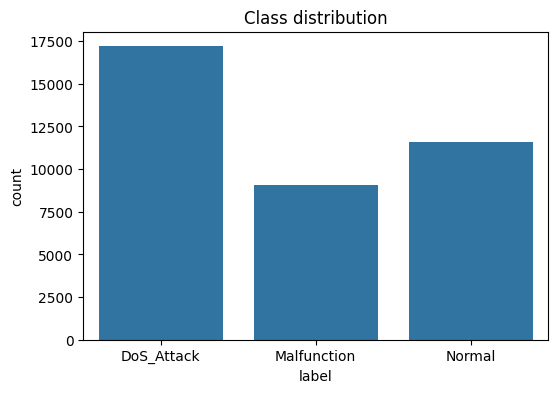

In [10]:
# Basic EDA: missing values and simple distributions
print('Missing values per column (top 10):')
print(df.isna().sum().sort_values(ascending=False).head(10))
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='label')
plt.title('Class distribution')
plt.show()

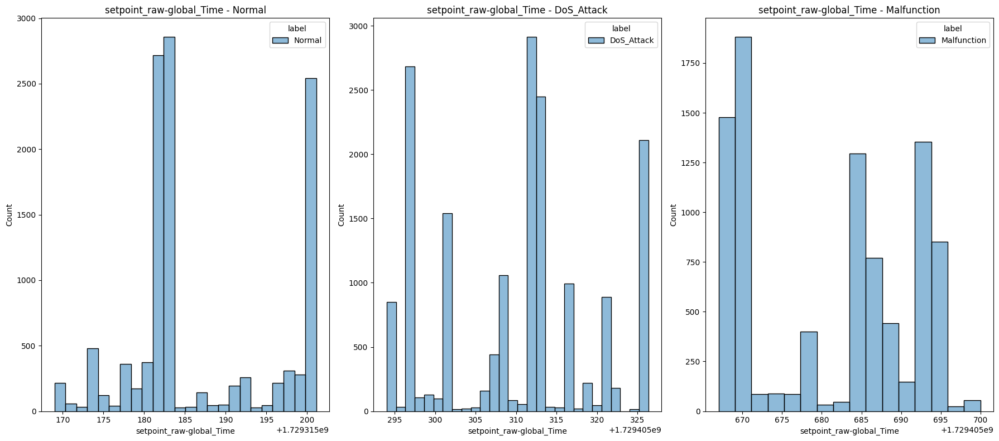

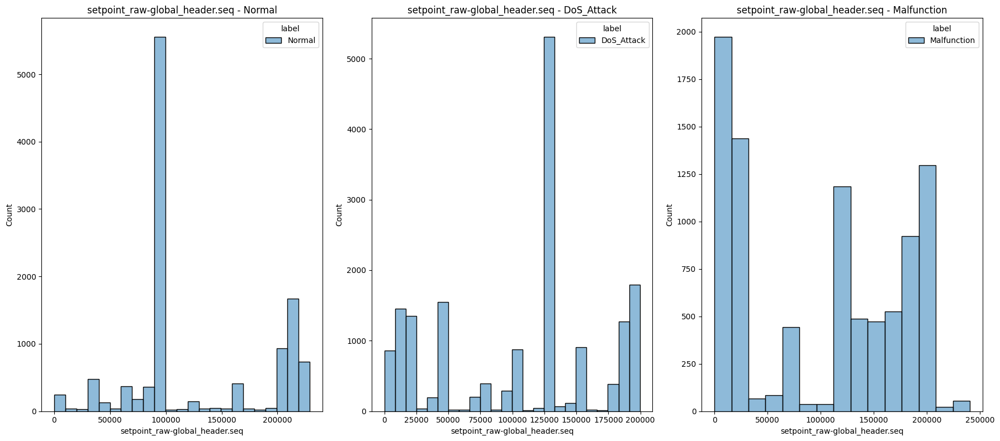

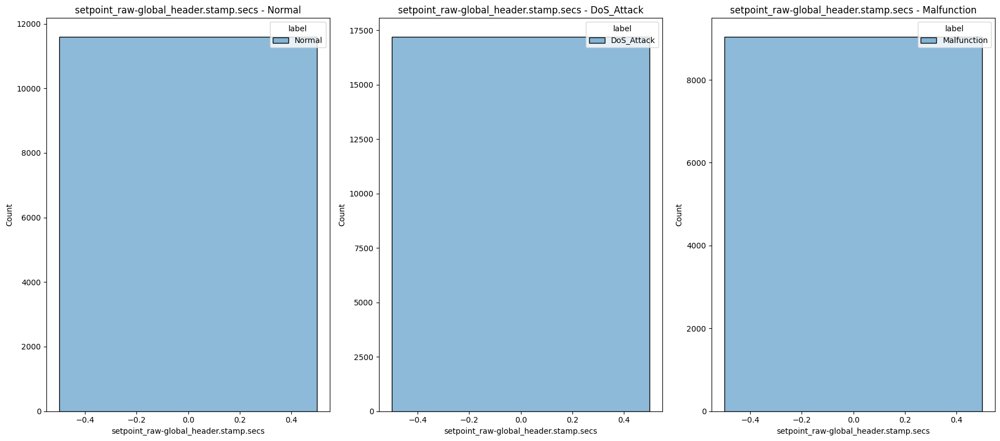

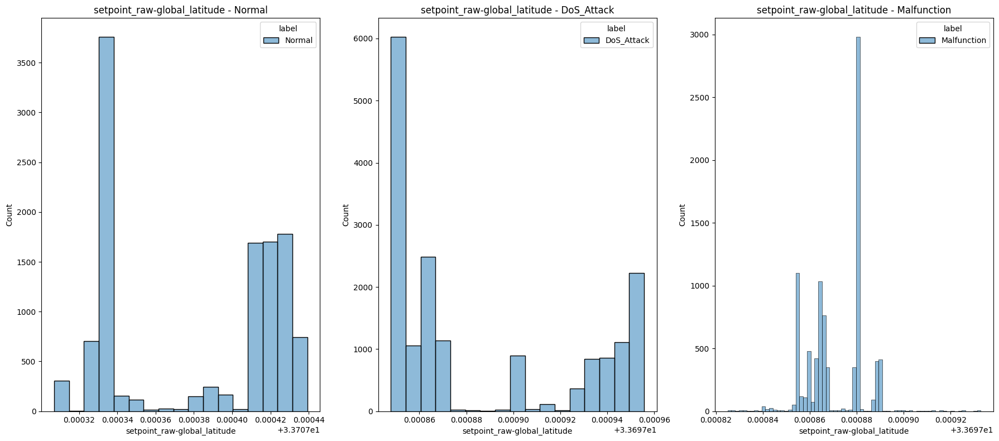

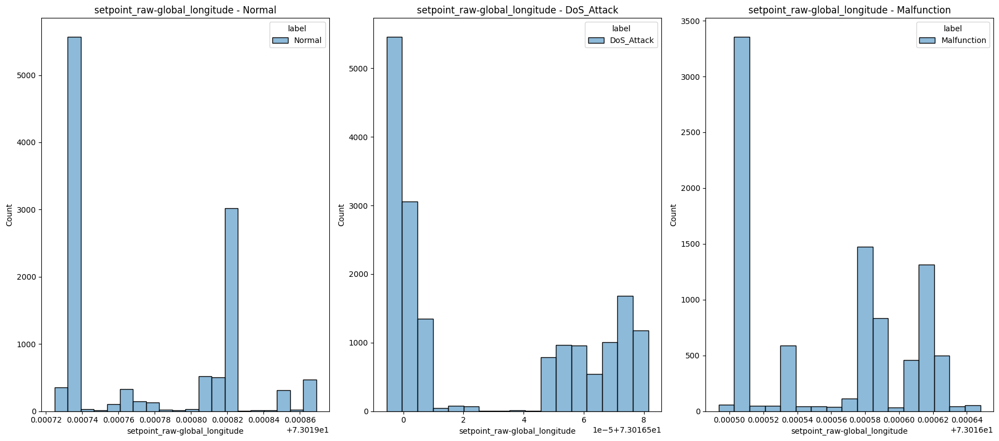

...

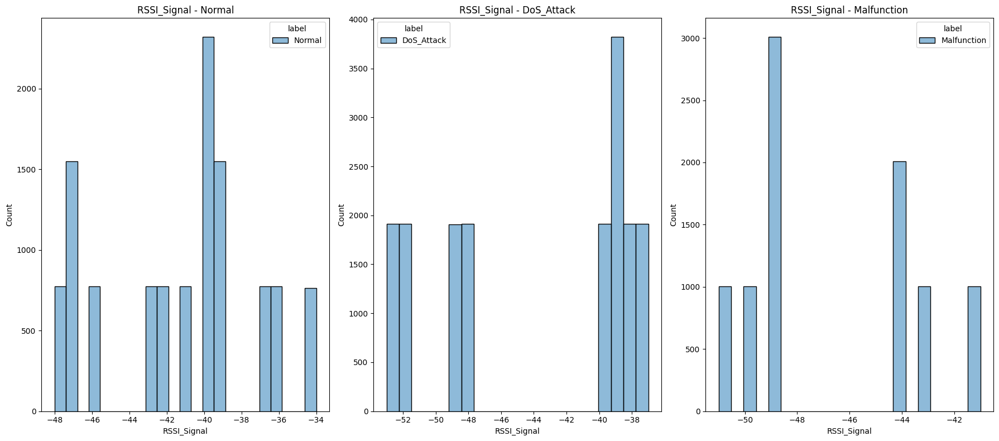

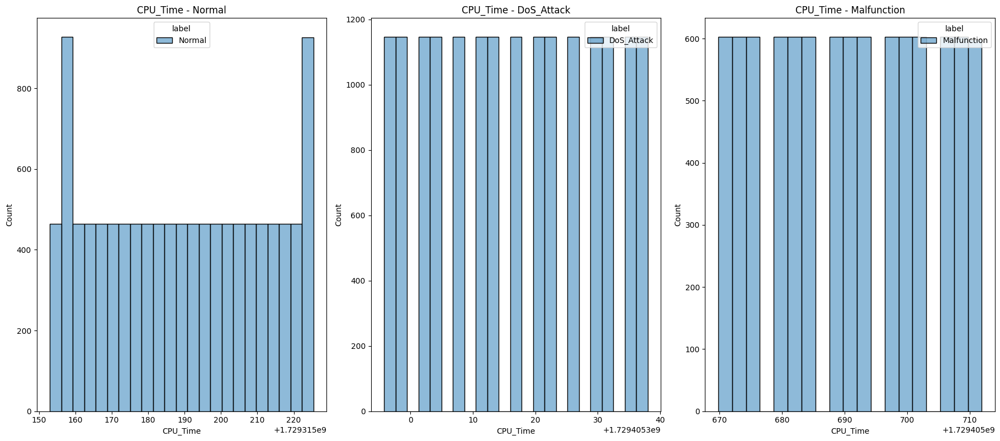

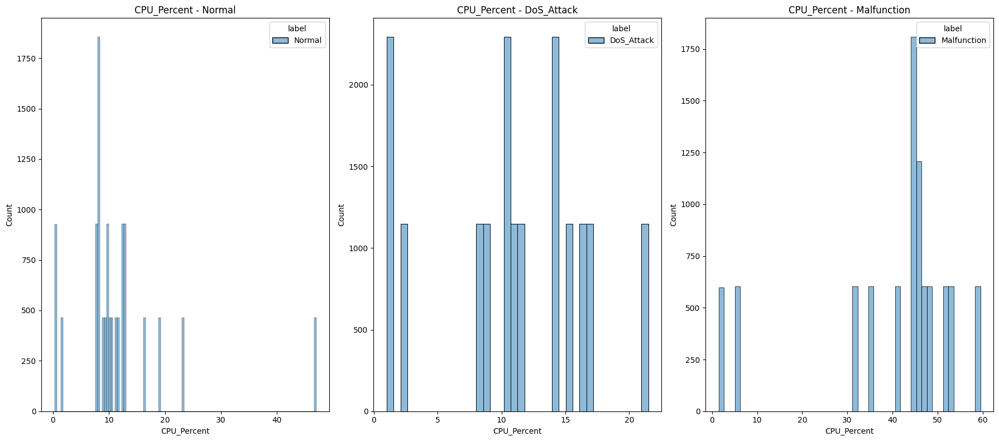

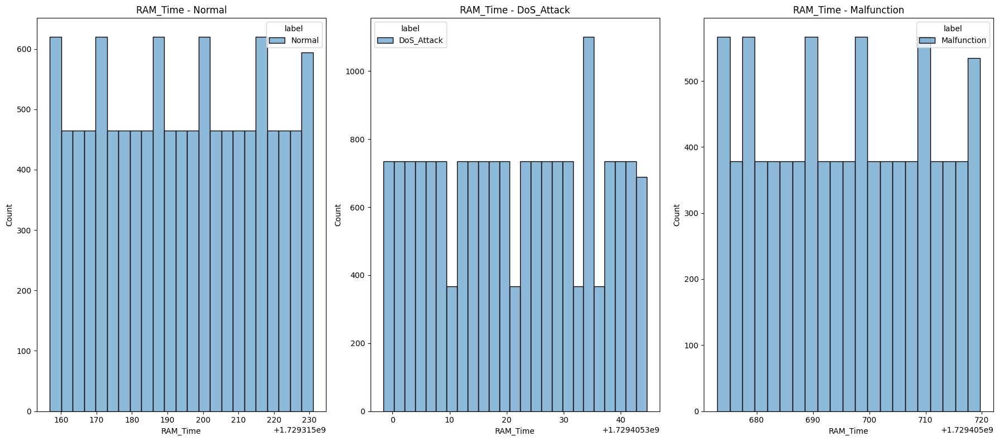

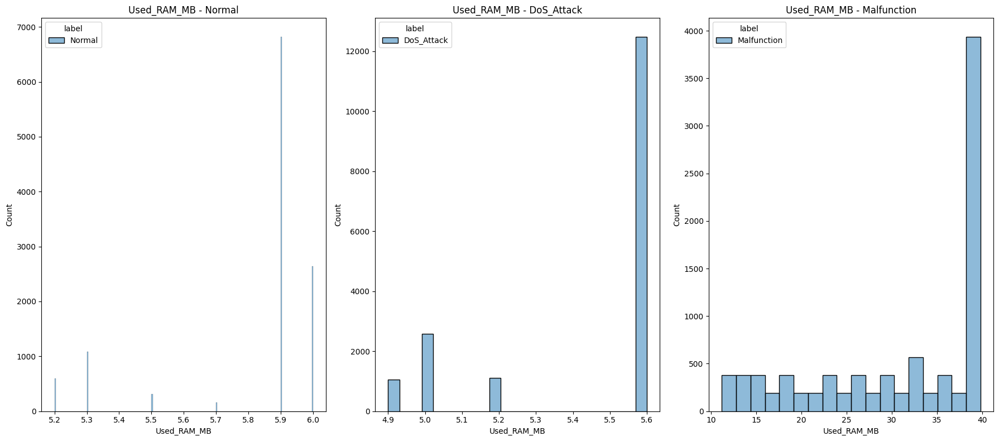

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numeric columns (histograms make sense for numeric data)
num_cols = df.select_dtypes(include='number').columns


labels = ['Normal', 'DoS_Attack', 'Malfunction']

for col in num_cols:
    if col == 'S.No':
        continue
    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    for i, label in enumerate(labels):
        dfsmall = df[df['label'] == label]
        sns.histplot(data=dfsmall, x=col, hue='label', kde=False, ax=axes[i])
        axes[i].set_title(f'{col} - {label}')
    plt.tight_layout()
    plt.show()



In [12]:
df.head()

,S.No,setpoint_raw-global_Time,setpoint_raw-global_header.seq,setpoint_raw-global_header.stamp.secs,setpoint_raw-global_latitude,setpoint_raw-global_longitude,setpoint_raw-global_altitude,battery_Time,battery_header.seq,battery_header.stamp.secs,...,state_manual_input,state_system_status,RSSI_Time,RSSI_Quality,RSSI_Signal,CPU_Time,CPU_Percent,RAM_Time,Used_RAM_MB,label
0,0,1.729405e+09,1,0,33.69785,73.016496,1.25,1.729405e+09,4605.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.0,-39.0,1.729405e+09,15.2,1.729405e+09,5.6,DoS_Attack
1,1,1.729405e+09,2,0,33.69785,73.016496,1.25,1.729405e+09,4605.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.0,-39.0,1.729405e+09,15.2,1.729405e+09,5.6,DoS_Attack
2,2,1.729405e+09,3,0,33.69785,73.016496,1.25,1.729405e+09,4605.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.0,-39.0,1.729405e+09,15.2,1.729405e+09,5.6,DoS_Attack
3,3,1.729405e+09,4,0,33.69785,73.016496,1.25,1.729405e+09,4605.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.0,-39.0,1.729405e+09,15.2,1.729405e+09,5.6,DoS_Attack
4,4,1.729405e+09,5,0,33.69785,73.016496,1.25,1.729405e+09,4605.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.0,-39.0,1.729405e+09,15.2,1.729405e+09,5.6,DoS_Attack


In [16]:


# df[timeColumns] = pd.to_datetime(df[timeColumns])


In [17]:
df.head()

,S.No,setpoint_raw-global_Time,setpoint_raw-global_header.seq,setpoint_raw-global_header.stamp.secs,setpoint_raw-global_latitude,setpoint_raw-global_longitude,setpoint_raw-global_altitude,battery_Time,battery_header.seq,battery_header.stamp.secs,...,state_manual_input,state_system_status,RSSI_Time,RSSI_Quality,RSSI_Signal,CPU_Time,CPU_Percent,RAM_Time,Used_RAM_MB,label
0,0,1970-01-01 00:00:01.729405294,1,0,33.69785,73.016496,1.25,1970-01-01 00:00:01.729405291,4605.0,1.729405e+09,...,1.0,5.0,1970-01-01 00:00:01.729405296,1.0,-39.0,1970-01-01 00:00:01.729405295,15.2,1970-01-01 00:00:01.729405298,5.6,DoS_Attack
1,1,1970-01-01 00:00:01.729405294,2,0,33.69785,73.016496,1.25,NaT,NaN,NaN,...,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaT,NaN,DoS_Attack
2,2,1970-01-01 00:00:01.729405294,3,0,33.69785,73.016496,1.25,NaT,NaN,NaN,...,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaT,NaN,DoS_Attack
3,3,1970-01-01 00:00:01.729405294,4,0,33.69785,73.016496,1.25,NaT,NaN,NaN,...,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaT,NaN,DoS_Attack
4,4,1970-01-01 00:00:01.729405294,5,0,33.69785,73.016496,1.25,NaT,NaN,NaN,...,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaT,NaN,DoS_Attack


label
DoS_Attack     17204
Normal         11599
Malfunction     9040
Name: count, dtype: int64


Text(0.5, 1.0, 'Missing Values per Feature')

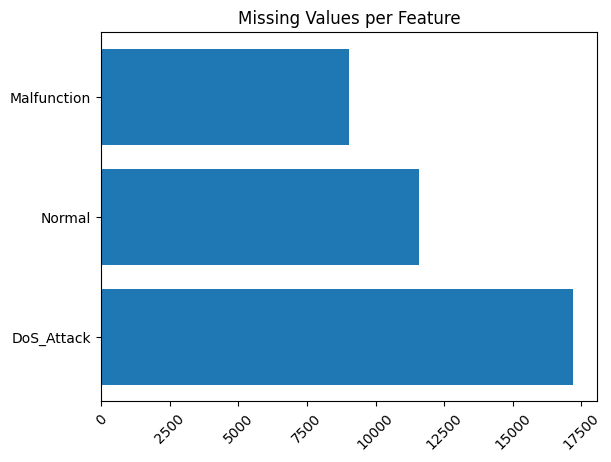

In [13]:
vc = df.label.value_counts()
print(vc)
plt.barh(vc.index, vc.values)
plt.xticks(rotation=45)
plt.title('Missing Values per Feature')


<Axes: xlabel='setpoint_raw-target_global_longitude', ylabel='global_position-global_longitude'>

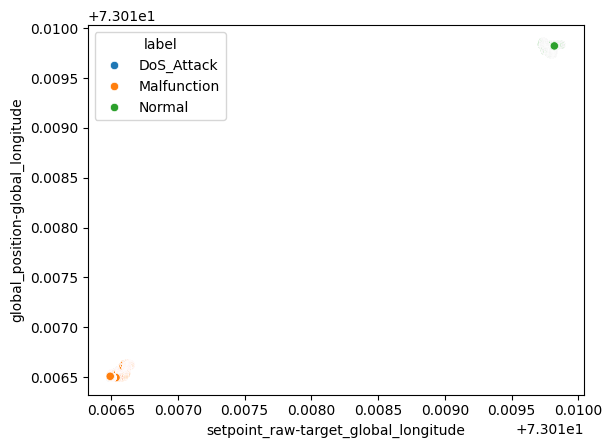

In [14]:
sns.scatterplot(x="setpoint_raw-target_global_longitude", y="global_position-global_longitude", hue='label', data=df)

<Axes: xlabel='setpoint_raw-target_global_latitude', ylabel='global_position-global_latitude'>

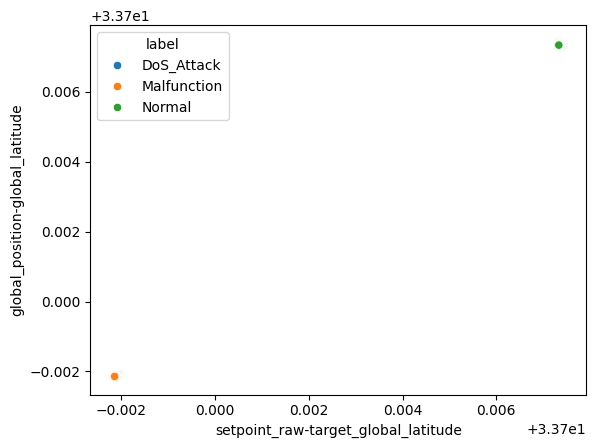

In [15]:
sns.scatterplot(x="setpoint_raw-target_global_latitude", y="global_position-global_latitude", hue='label', data=df)

In [19]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
pio.renderers.default = "notebook_connected"

# pio.renderers.default = "iframe_connected"
latLongCols = [c for c in df.columns if 'latitude' in c or 'longitude' in c]

for col in latLongCols:
    print("hi")
    fig = px.scatter(df, x=col, y=col, color="label")
    fig.show()




hi


hi


hi


hi


hi


hi


In [20]:
fig = px.scatter(df, x='CPU_Percent', y='CPU_Percent', color="label")
fig.show()
fig = px.scatter(df, x='Used_RAM_MB', y='Used_RAM_MB', color="label")
fig.show()


In [21]:
import plotly.express as px

# Extract columns
timeColumns = [c for c in df.columns if 'Time' in c]
sequenceColumns = [c for c in df.columns if '.seq' in c]
print('Time columns:', timeColumns)
print('Sequence columns:', sequenceColumns)
# Convert datetime → seconds (ONLY if needed)
# df[timeColumns] = df[timeColumns].apply(pd.to_datetime)
# for col in timeColumns:
#     df[col] = (df[col] - df[col].iloc[0]).dt.total_seconds()

# Loop and plot each sequence with its matching timestamp
for seq_col in sequenceColumns:
    # Find matching time column based on prefix
    prefix = seq_col.split('.')[0].split("_hea")[0]   # e.g., "setpoint_raw-global_header"
    print(prefix)
    time_col = [t for t in timeColumns if prefix in t]
    print(time_col)

    if not time_col:
        continue  # no matching time column found

    time_col = time_col[0]  # use the first match

    fig = px.scatter(
        df,
        x=time_col,
        y=seq_col,
        color="label",
        title=f"{seq_col} vs {time_col}"
    )
    fig.show()


Time columns: ['setpoint_raw-global_Time', 'battery_Time', 'global_position-local_Time', 'imu-data_Time', 'rc-out_Time', 'vfr_hud_Time', 'setpoint_raw-target_global_Time', 'state_Time', 'RSSI_Time', 'CPU_Time', 'RAM_Time']
Sequence columns: ['setpoint_raw-global_header.seq', 'battery_header.seq', 'global_position-local_header.seq', 'imu-data_header.seq', 'rc-out_header.seq', 'vfr_hud_header.seq', 'setpoint_raw-target_global_header.seq', 'state_header.seq']
setpoint_raw-global
['setpoint_raw-global_Time']


battery
['battery_Time']


global_position-local
['global_position-local_Time']


imu-data
['imu-data_Time']


rc-out
['rc-out_Time']


vfr_hud
['vfr_hud_Time']


setpoint_raw-target_global
['setpoint_raw-target_global_Time']


state
['state_Time']


In [22]:
# import plotly.express as px

# # Extract columns
# timeColumns = [c for c in df.columns if 'Time' in c]
# sequenceColumns = [c for c in df.columns if '.seq' in c]
# print('Time columns:', timeColumns)
# print('Sequence columns:', sequenceColumns)
# # Convert datetime → seconds (ONLY if needed)
# # df[timeColumns] = df[timeColumns].apply(pd.to_datetime)
# # for col in timeColumns:
# #     df[col] = (df[col] - df[col].iloc[0]).dt.total_seconds()

# # Loop and plot each sequence with its matching timestamp
# for seq_col in sequenceColumns:
#     # Find matching time column based on prefix
#     prefix = seq_col.split('.')[0].split("_hea")[0]   # e.g., "setpoint_raw-global_header"
#     print(prefix)
#     time_col = [t for t in timeColumns if prefix in t]
#     print(time_col)

#     if not time_col:
#         continue  # no matching time column found

#     time_col = time_col[0]  # use the first match

#     fig = px.scatter(
#         df,
#         x=time_col,
#         y=seq_col,
#         color="label",
#         title=f"{seq_col} vs {time_col}"
#     )
#     fig.show()


Numeric columns count: 79
Plotting columns found: ['battery_voltage', 'battery_current', 'battery_percentage', 'vfr_hud_airspeed', 'vfr_hud_groundspeed', 'RSSI_Quality', 'CPU_Percent', 'Used_RAM_MB']


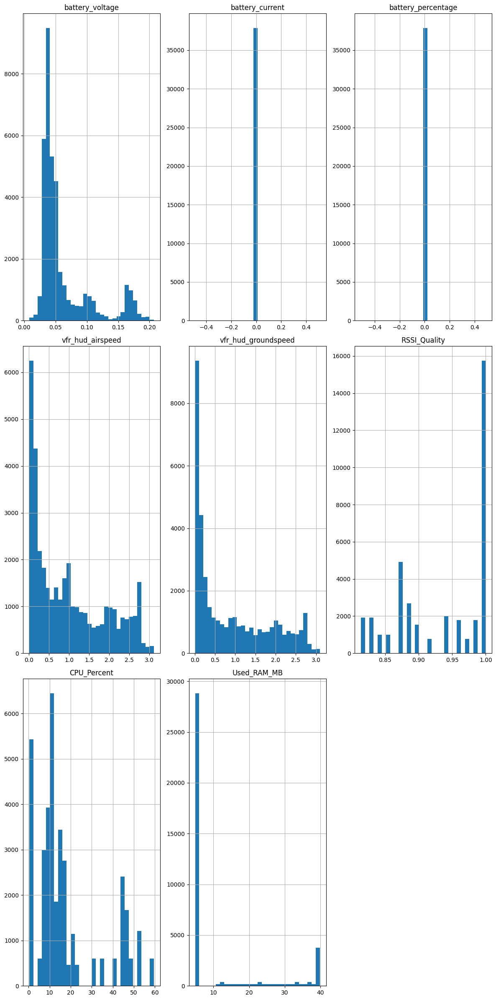


Sample rows:


,S.No,setpoint_raw-global_Time,setpoint_raw-global_header.seq,setpoint_raw-global_header.stamp.secs,setpoint_raw-global_latitude,setpoint_raw-global_longitude,setpoint_raw-global_altitude,battery_Time,battery_header.seq,battery_header.stamp.secs,...,state_manual_input,state_system_status,RSSI_Time,RSSI_Quality,RSSI_Signal,CPU_Time,CPU_Percent,RAM_Time,Used_RAM_MB,label
22023,4819,1.729406e+09,126460,0,33.697855,73.016576,6.443,1.729406e+09,8551.0,1.729406e+09,...,1.0,5.0,1.729406e+09,0.942857,-44.0,1.729406e+09,45.0,1.729406e+09,36.5,Malfunction
34133,7889,1.729315e+09,164592,0,33.707330,73.019811,7.997,1.729315e+09,15380.0,1.729315e+09,...,1.0,5.0,1.729315e+09,0.957143,-43.0,1.729315e+09,10.6,1.729315e+09,6.0,Normal
3594,3594,1.729405e+09,23713,0,33.697850,73.016495,2.293,1.729405e+09,4686.0,1.729405e+09,...,1.0,5.0,1.729405e+09,1.000000,-37.0,1.729405e+09,8.1,1.729405e+09,5.6,DoS_Attack
12296,12296,1.729405e+09,130993,0,33.697955,73.016548,5.865,1.729405e+09,4884.0,1.729405e+09,...,1.0,5.0,1.729405e+09,0.885714,-48.0,1.729405e+09,21.5,1.729405e+09,5.6,DoS_Attack
22277,5073,1.729406e+09,126900,0,33.697855,73.016577,6.442,1.729406e+09,8562.0,1.729406e+09,...,1.0,5.0,1.729406e+09,0.857143,-50.0,1.729406e+09,44.7,1.729406e+09,37.1,Malfunction


In [36]:
# EDA: overview statistics and types

# Missing value summary (percentages)
# miss = df.isna().sum().sort_values(ascending=False)
# miss_pct = (df.isna().mean()*100).sort_values(ascending=False)
# miss_df = pd.concat([miss, miss_pct], axis=1)
# miss_df.columns = ['missing_count', 'missing_pct']
# print('\nTop 20 columns by missing values:')
# display(miss_df.head(20))
# list numeric columns for plotting
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print('Numeric columns count:', len(numeric_cols))
# Pick a handful of telemetry columns (common names) if present
candidates = ['battery_voltage','battery_current','battery_percentage','vfr_hud_airspeed','vfr_hud_groundspeed','RSSI_Quality','CPU_Percent','Used_RAM_MB']
plot_cols = [c for c in candidates if c in df.columns]
print('Plotting columns found:', plot_cols)
if len(plot_cols) > 0:
    df[candidates].hist(bins=30, figsize=(12, 3*len(plot_cols)))
    plt.tight_layout()
    plt.show()
# If data is large, show a small sample of rows
print('\nSample rows:')
display(df.sample(min(5, len(df)), random_state=42))

In [43]:
threshold = 0.9
df = df.dropna(axis=1, thresh=int((1 - threshold) * len(df)))
drop_cols = [c for c in df.columns if ("_Time" in c) or (".seq" in c) or  (".secs" in c) or ("S.No" in c)]
print('Dropping columns:', drop_cols)
# df.drop(columns=['S.No'], inplace=True)
df.drop(columns=drop_cols, inplace=True)


Dropping columns: []


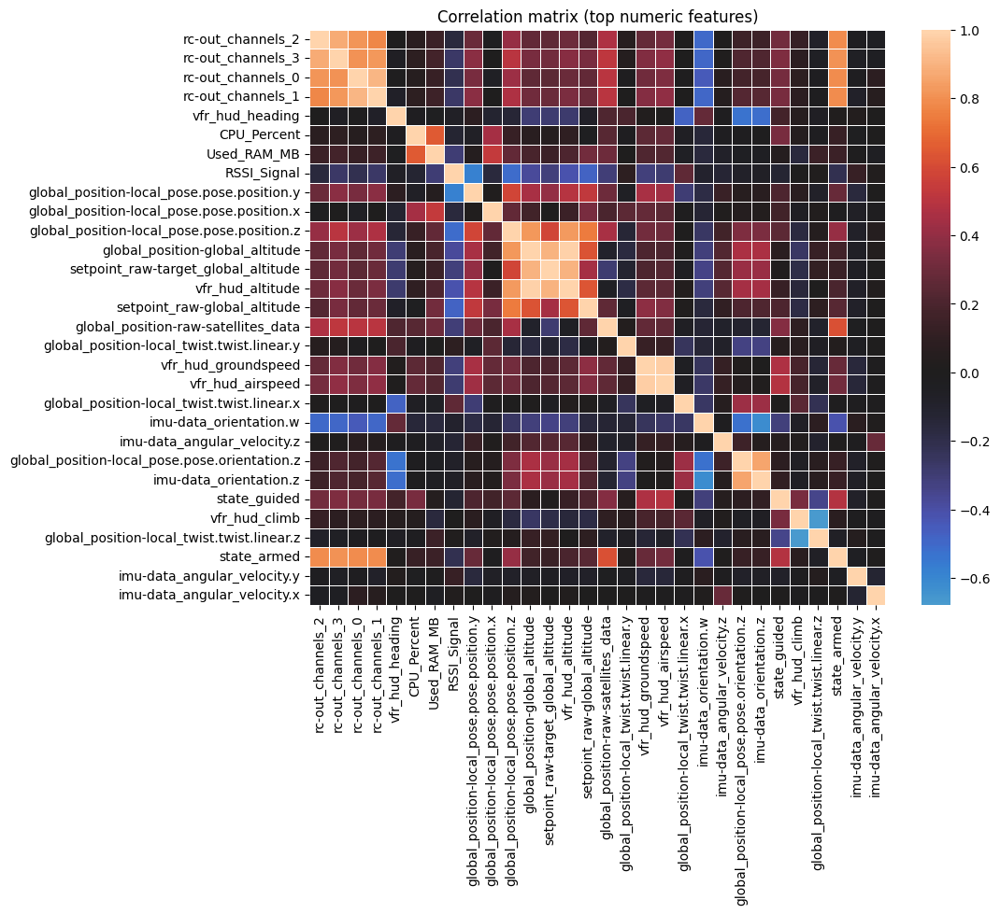

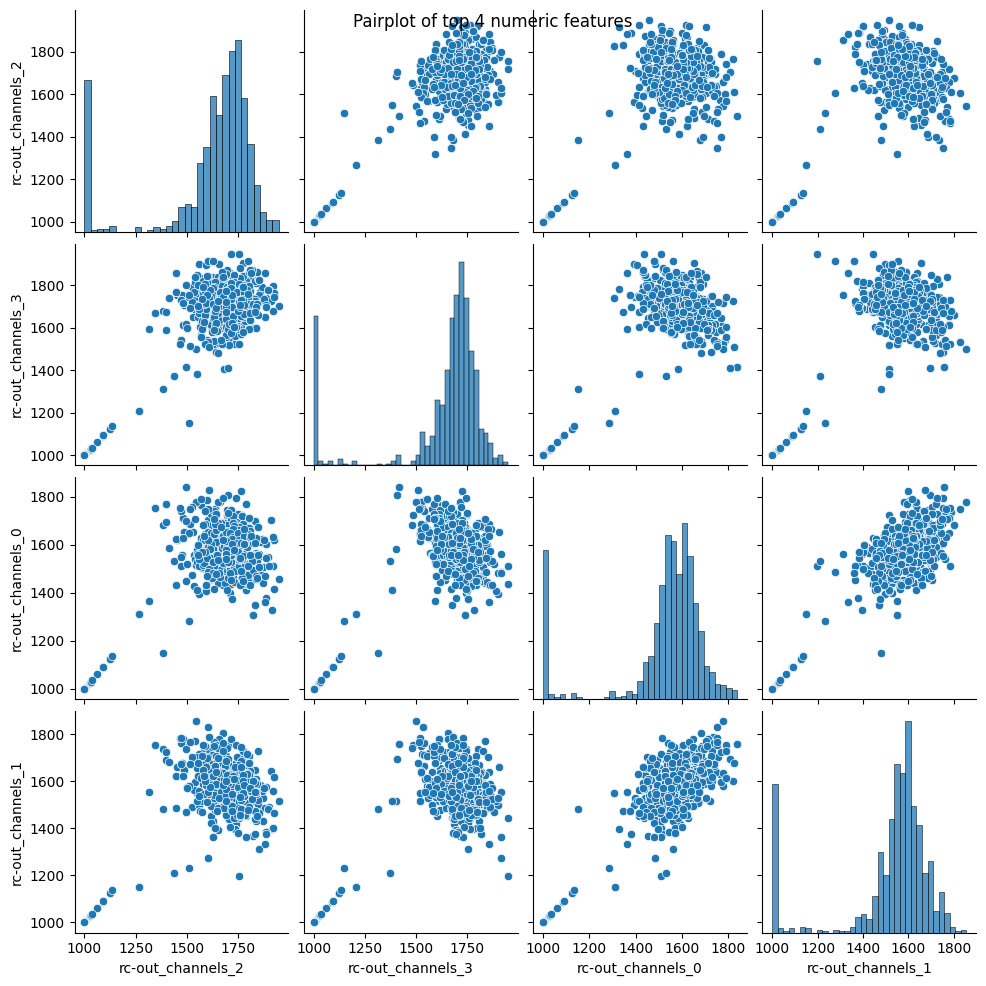

In [44]:
# Correlation matrix for numeric features (show top features only to keep plots readable)
numeric = df.select_dtypes(include=[np.number]).copy()
if numeric.shape[1] == 0:
    print('No numeric features available for correlation matrix')
else:
    # compute correlation and pick top features by variance to show
    var = numeric.var().sort_values(ascending=False)
    top_feats = var.head(30).index.tolist() if len(var) > 30 else var.index.tolist()
    corr = numeric[top_feats].corr()
    plt.figure(figsize=(10,8))
    sns.heatmap(corr, center=0, square=True, linewidths=.5)
    plt.title('Correlation matrix (top numeric features)')
    plt.show()
    # Pairplot of the top 4 features (if at least 4 exist) - use sample to limit size
    if len(top_feats) >= 4:
        sample_df = numeric[top_feats[:4]].sample(min(1000, len(numeric)), random_state=42)
        sns.pairplot(sample_df)
        plt.suptitle('Pairplot of top 4 numeric features')
        plt.show()

Potential time columns found: []
State columns candidates: ['state_connected', 'state_armed', 'state_guided', 'state_manual_input', 'state_system_status']

Value counts for state_connected
state_connected
1.0    37843
Name: count, dtype: int64

Value counts for state_armed
state_armed
1.0    34822
0.0     3021
Name: count, dtype: int64

Value counts for state_guided
state_guided
1.0    28682
0.0     9161
Name: count, dtype: int64

Value counts for state_manual_input
state_manual_input
1.0    37843
Name: count, dtype: int64

Value counts for state_system_status
state_system_status
5.0    37843
Name: count, dtype: int64


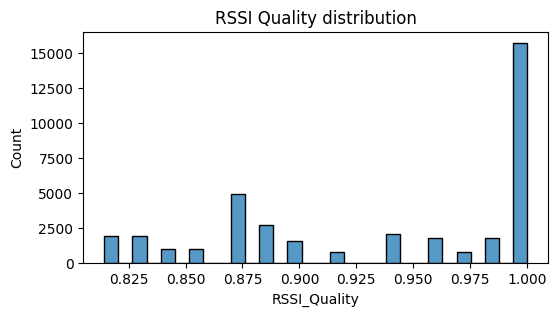


EDA complete. Next: feature engineering and preprocessing.


In [46]:
# Time and state checks: detect timestamp-like columns and basic state distributions
time_cols = [c for c in df.columns if 'Time' in c or 'time' in c.lower() or 'stamp' in c.lower()]
print('Potential time columns found:', time_cols)
# Try converting first time column to datetime if present
if len(time_cols) > 0:
    tcol = time_cols[0]
    try:
        df['_ts_parsed'] = pd.to_datetime(df[tcol], unit='s', errors='coerce')
        print('Parsed datetime from', tcol, ' — nulls:', df['_ts_parsed'].isna().sum())
        # plot CPU over time if available
        if 'CPU_Percent' in df.columns:
            sample = df[[ '_ts_parsed', 'CPU_Percent']].dropna().sort_values('_ts_parsed').head(5000)
            plt.figure(figsize=(12,3))
            plt.plot(sample['_ts_parsed'], sample['CPU_Percent'], marker='.', linestyle='-', markersize=2)
            plt.title('CPU Percent over time (sample)')
            plt.xlabel('time')
            plt.ylabel('CPU_Percent')
            plt.show()
    except Exception as e:
        print('Could not parse time column:', e)
# State columns distribution (boolean-like)
state_cols = [c for c in df.columns if c.lower().startswith('state') or c.lower().startswith('state_') or c.lower().startswith('state-') or c.lower().startswith('state ')]
print('State columns candidates:', state_cols)
for c in state_cols:
    print('\nValue counts for', c)
    print(df[c].value_counts(dropna=False).head(20))
# If RSSI exists, show distribution
if 'RSSI_Quality' in df.columns:
    plt.figure(figsize=(6,3))
    sns.histplot(df['RSSI_Quality'].dropna(), bins=30)
    plt.title('RSSI Quality distribution')
    plt.show()
print('\nEDA complete. Next: feature engineering and preprocessing.')

Counts by label:
label
DoS_Attack     17204
Normal         11599
Malfunction     9040
Name: count, dtype: int64
Numeric features count: 51
label
DoS_Attack     17204
Normal         11599
Malfunction     9040
Name: count, dtype: int64
Numeric features count: 51


label,DoS_Attack,Malfunction,Normal
setpoint_raw-global_latitude,33.697887,33.697871,33.707381
setpoint_raw-global_longitude,73.016527,73.016558,73.019775
setpoint_raw-global_altitude,4.384453,4.433805,3.304956
battery_voltage,0.040632,0.048436,0.102813
battery_current,0.010000,0.010000,0.010000
battery_temperature,0.000000,0.000000,0.000000
battery_percentage,-0.010000,-0.010000,-0.010000
global_position-local_pose.pose.position.x,-0.178857,3.018208,-0.974508
global_position-local_pose.pose.position.y,2.707417,1.602838,0.681387
global_position-local_pose.pose.position.z,4.108348,4.219806,2.111759


Top features by mean difference: ['rc-out_channels_3', 'rc-out_channels_2', 'rc-out_channels_1', 'rc-out_channels_0', 'vfr_hud_heading', 'CPU_Percent', 'Used_RAM_MB', 'RSSI_Signal', 'global_position-local_pose.pose.position.x', 'global_position-raw-satellites_data', 'setpoint_raw-target_global_altitude', 'global_position-local_pose.pose.position.z']


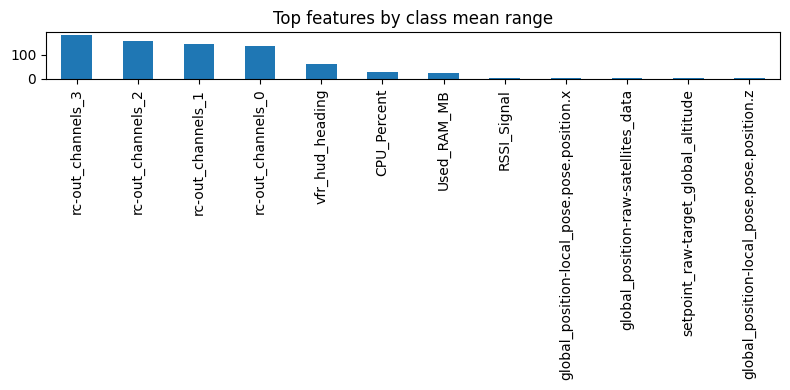

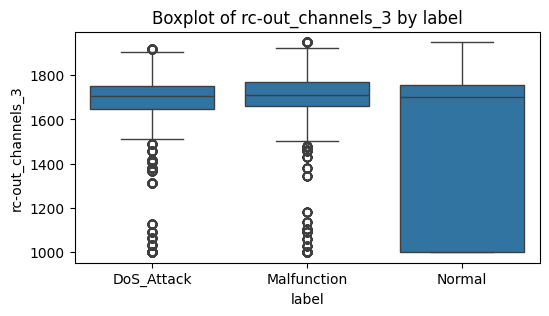

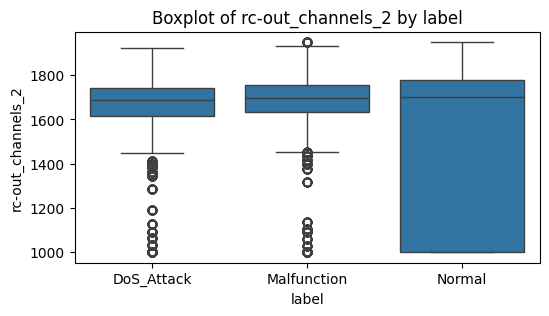

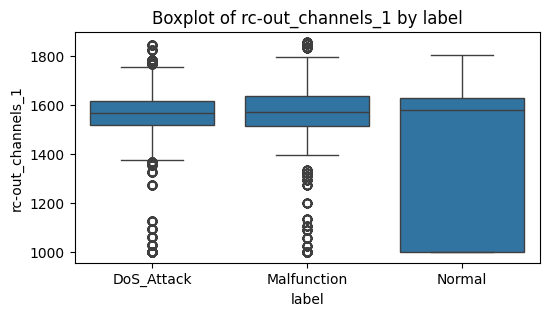

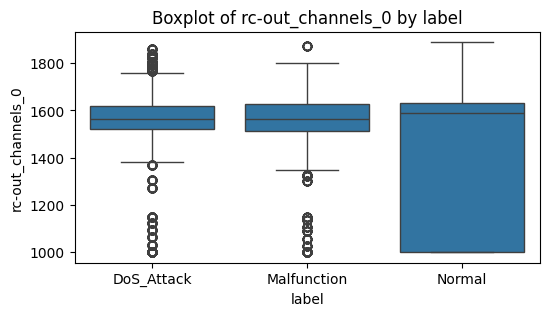

...

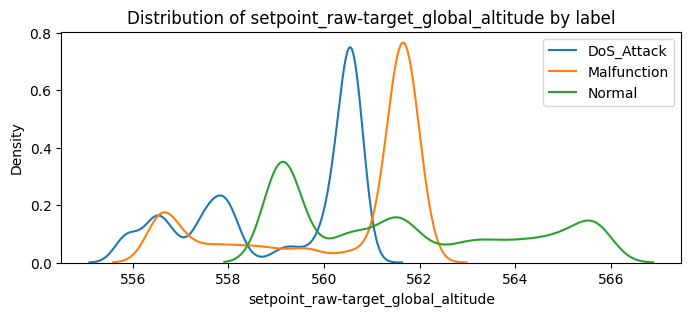

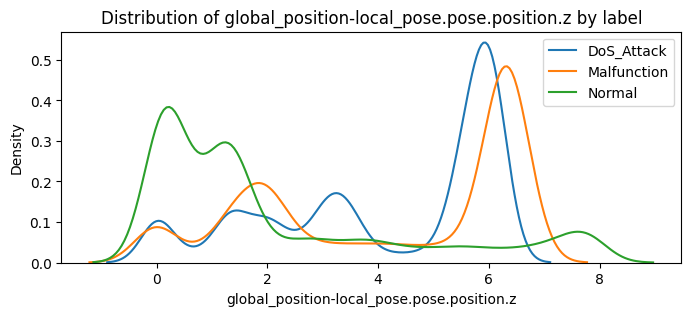

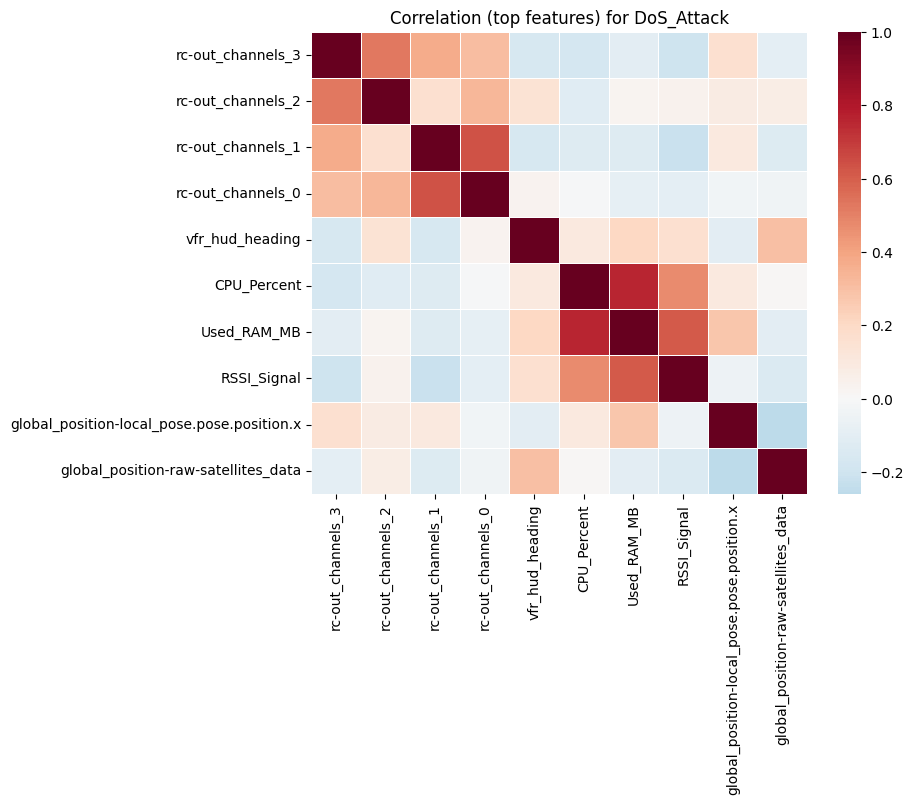

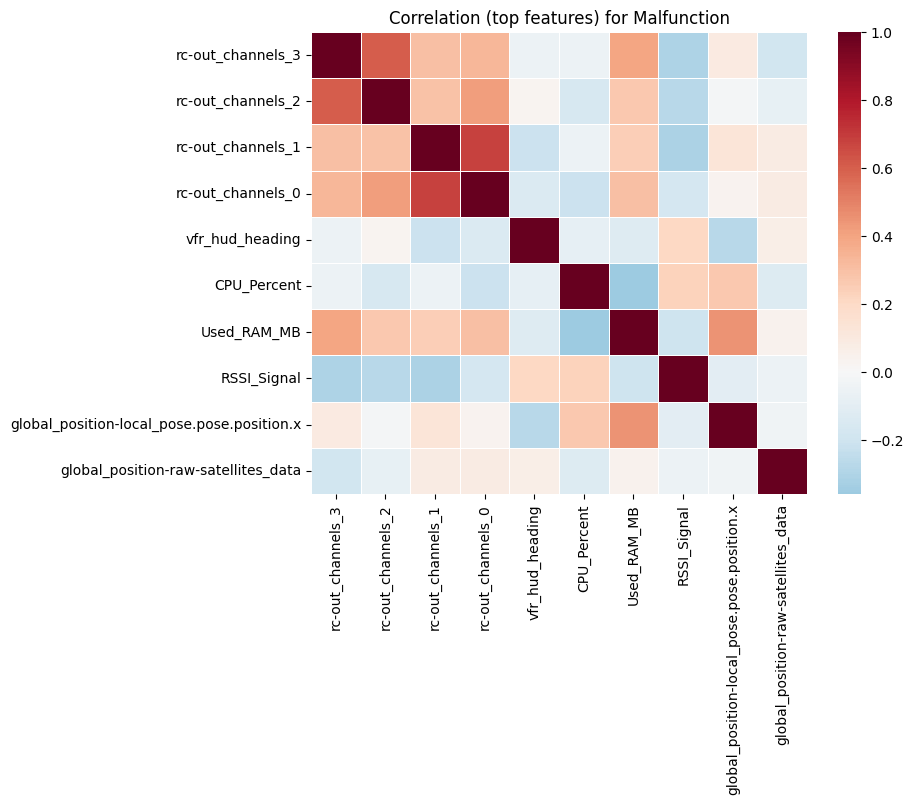

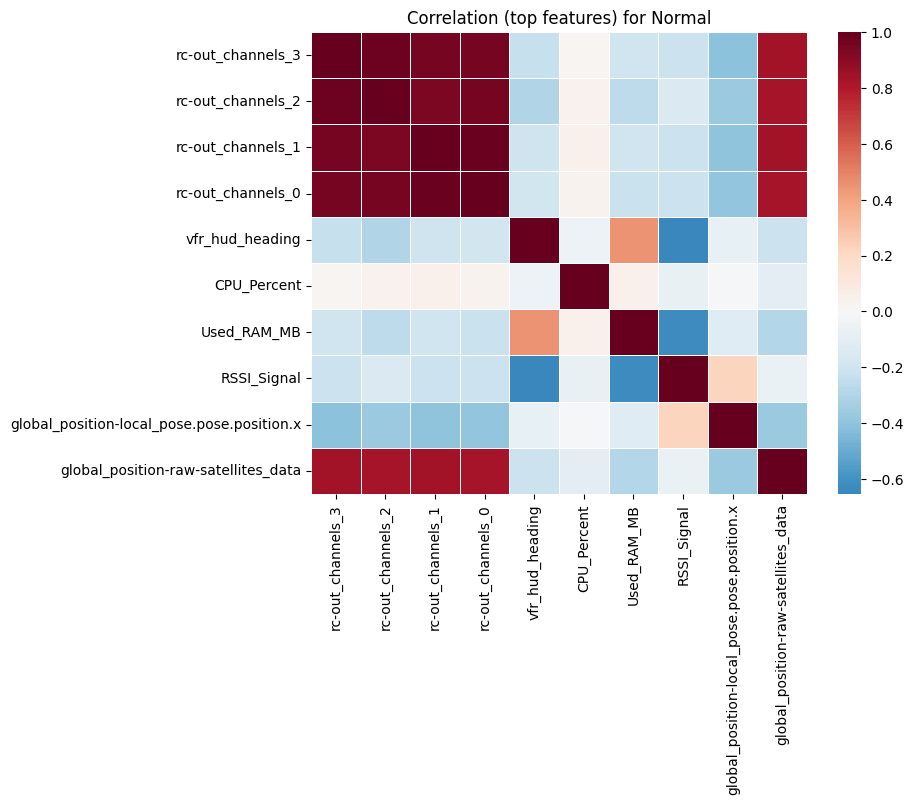


Label-wise EDA complete.


In [ ]:
# EDA by label: group statistics and class-wise plots
print('Counts by label:')
vc = df['label'].value_counts()
print(vc)
# ensure numeric variable list available
numeric = df.select_dtypes(include=[np.number]).columns.tolist()
print('Numeric features count:', len(numeric))
# group means for numeric features
group_mean = df.groupby('label')[numeric].mean() if len(numeric)>0 else pd.DataFrame()
if not group_mean.empty:
    display(group_mean.T.head(20))
    # top features where class means differ the most
    range_per_feature = group_mean.max() - group_mean.min()
    top_diff = range_per_feature.sort_values(ascending=False).head(12).index.tolist()
    print('Top features by mean difference:', top_diff)
    plt.figure(figsize=(8,4))
    range_per_feature[top_diff].plot(kind='bar')
    plt.title('Top features by class mean range')
    plt.tight_layout()
    plt.show()
    # Boxplots for top features
    for feat in top_diff[:20]:
        plt.figure(figsize=(6,3))
        sns.boxplot(x='label', y=feat, data=df, order=sorted(df['label'].unique()))
        plt.title(f'Boxplot of {feat} by label')
        plt.show()
    # Class-wise KDE/histograms for top 4 features
    for feat in top_diff[:20]:
        plt.figure(figsize=(8,3))
        for lbl in sorted(df['label'].unique()):
            sns.kdeplot(df.loc[df['label']==lbl, feat].dropna(), label=lbl, fill=False)
        plt.title(f'Distribution of {feat} by label')
        plt.legend()
        plt.show()
    # Correlation heatmap per class (top features)
    for lbl in sorted(df['label'].unique()):
        sub = df[df['label']==lbl][top_diff[:20]]
        if sub.shape[0] > 10:
            plt.figure(figsize=(8,6))
            sns.heatmap(sub.corr(), cmap='RdBu_r', center=0, linewidths=.5)
            plt.title(f'Correlation (top features) for {lbl}')
            plt.show()
else:
    print('No numeric features available to compute group statistics.')
print('\nLabel-wise EDA complete.')

In [48]:
cols1 = (df.isna().sum() / len(df) > 0.90)
# print(len(df.columns))
print(len(df.columns[cols1]))





0


# Part 2: Model scaffolds
Below are scaffolded cells for training the six required models. These cells provide preprocessing hooks, training functions, and evaluation helpers. The deep models (LSTM, 1D-CNN, VAE, FNN) use Keras/TensorFlow; ensure `tensorflow` is installed to run them.

In [49]:
from sklearn.impute import SimpleImputer
# Shared preprocessing: select numeric features, impute, scale, and split
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
# select numeric features (drop identifiers and timestamps)
drop_cols = [c for c in df.columns if 'Time' in c or 'time' in c.lower() or 'seq' in c.lower() or c=='S.No' or c=='S.No.']
X = df.drop(columns=[c for c in drop_cols if c in df.columns] + ['label'], errors='ignore')
# keep only numeric columns for baseline models; leave deep models for later feature engineering
X = X.select_dtypes(include=[np.number]).copy()
y = df['label'].copy()
print('X shape (numeric only):', X.shape)
# encode labels
le = LabelEncoder()
y_enc = le.fit_transform(y)
print('Classes:', le.classes_)
# train/val/test split 70/15/15 stratified
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y_enc, test_size=0.15, random_state=42, stratify=y_enc)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.1764706, random_state=42, stratify=y_train_full)
# (0.17647 of 85% => ~15% overall)
print('Train, Val, Test shapes:', X_train.shape, X_val.shape, X_test.shape)
# impute and scale
imputer = SimpleImputer(strategy='median')
scaler = StandardScaler()
X_train_imp = imputer.fit_transform(X_train)
X_val_imp = imputer.transform(X_val)
X_test_imp = imputer.transform(X_test)
X_train_scaled = scaler.fit_transform(X_train_imp)
X_val_scaled = scaler.transform(X_val_imp)
X_test_scaled = scaler.transform(X_test_imp)
print('Preprocessing done')

X shape (numeric only): (37843, 51)
Classes: ['DoS_Attack' 'Malfunction' 'Normal']
Train, Val, Test shapes: (26489, 51) (5677, 51) (5677, 51)
Preprocessing done
Preprocessing done


## 2.3 SVM (sklearn)

In [50]:
from sklearn.svm import SVC
svc = SVC(kernel='rbf', C=1.0, probability=True, random_state=42)
train_subset = slice(None)
svc.fit(X_train_scaled[train_subset], y_train[train_subset])
y_pred_svc = svc.predict(X_val_scaled)
print('SVC val acc:', accuracy_score(y_val, y_pred_svc))
print(classification_report(y_val, y_pred_svc, target_names=le.classes_))

SVC val acc: 1.0
              precision    recall  f1-score   support

  DoS_Attack       1.00      1.00      1.00      2581
 Malfunction       1.00      1.00      1.00      1356
      Normal       1.00      1.00      1.00      1740

    accuracy                           1.00      5677
   macro avg       1.00      1.00      1.00      5677
weighted avg       1.00      1.00      1.00      5677



## 2.4 LSTM - sequence model 

In [51]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
from tensorflow.keras import callbacks
from tensorflow import keras
from tensorflow.keras import layers # pyright: ignore[reportMissingImports]

# Prepare sliding-window sequences for LSTM, build and train model
# Uses existing X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test, le, make_lstm_model, eval_and_record
def make_lstm_model(input_shape, n_classes, units=[64,32], dropout=0.2):
    from tensorflow.keras import layers, models # type: ignore
    inp = layers.Input(shape=input_shape)
    x = inp
    for u in units:
        x = layers.LSTM(u, return_sequences=True)(x)
        x = layers.Dropout(dropout)(x)
    x = layers.LSTM(units[-1])(x)
    out = layers.Dense(n_classes, activation='softmax')(x)
    model = models.Model(inp, out)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model





def make_sequences(X, y, seq_len=10, step=1):
    """
    Convert 2D feature matrix X (n_samples, n_features) into
    3D sequences (n_sequences, seq_len, n_features).
    Label for each sequence is the label at the last timestep.
    """
    X = np.asarray(X)
    y = np.asarray(y)
    n_samples = X.shape[0]
    if n_samples < seq_len:
        return np.empty((0, seq_len, X.shape[1])), np.empty((0,), dtype=y.dtype)
    indices = range(0, n_samples - seq_len + 1, step)
    seq_count = len(list(indices))
    X_seq = np.zeros((seq_count, seq_len, X.shape[1]), dtype=X.dtype)
    y_seq = np.zeros((seq_count,), dtype=y.dtype)
    i = 0
    for start in indices:
        end = start + seq_len
        X_seq[i] = X[start:end]
        y_seq[i] = y[end - 1]   # label at last timestep
        i += 1
    return X_seq, y_seq

# Choose sequence length and step
seq_len = 10
step = 1

# Build sequences for train/val/test
X_train_seq, y_train_seq = make_sequences(X_train_scaled, y_train, seq_len=seq_len, step=step)
X_val_seq, y_val_seq     = make_sequences(X_val_scaled,   y_val,   seq_len=seq_len, step=step)
X_test_seq, y_test_seq   = make_sequences(X_test_scaled,  y_test,  seq_len=seq_len, step=step)

print(f"Sequences shapes -> train: {X_train_seq.shape}, val: {X_val_seq.shape}, test: {X_test_seq.shape}")

# If no sequences could be built, abort gracefully
if X_train_seq.shape[0] == 0:
    raise RuntimeError(f"Not enough training rows to build sequences of length {seq_len} (got {X_train_scaled.shape[0]} rows). Reduce seq_len.")

# Build LSTM model
try:
    lstm_model = make_lstm_model(input_shape=(seq_len, X_train_seq.shape[2]), n_classes=len(le.classes_), units=[64,32], dropout=0.2)
except Exception as e:
    raise RuntimeError("Could not build LSTM model (is TensorFlow installed?). Error: " + str(e))

# Train with early stopping
es = callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
history = lstm_model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_val_seq, y_val_seq) if X_val_seq.shape[0] > 0 else None,
    epochs=30,
    batch_size=64,
    callbacks=[es],
    verbose=2
)

# Evaluate and record results (uses eval_and_record helper)
# Note: eval_and_record expects 2D or 3D input; it handles argmax for probabilistic outputs.
try:
    eval_and_record('LSTM', lstm_model, X_train_seq, X_test_seq, y_train_seq, y_test_seq)
except Exception as e:
    # fallback: simple test evaluation print
    y_pred = lstm_model.predict(X_test_seq)
    if y_pred.ndim > 1:
        y_pred = np.argmax(y_pred, axis=1)
    print('LSTM test acc:', accuracy_score(y_test_seq, y_pred))
    print(classification_report(y_test_seq, y_pred, target_names=le.classes_))

Sequences shapes -> train: (26480, 10, 51), val: (5668, 10, 51), test: (5668, 10, 51)
Epoch 1/30
Epoch 1/30
414/414 - 14s - 34ms/step - accuracy: 0.8269 - loss: 0.3685 - val_accuracy: 1.0000 - val_loss: 0.0042
Epoch 2/30
414/414 - 14s - 34ms/step - accuracy: 0.8269 - loss: 0.3685 - val_accuracy: 1.0000 - val_loss: 0.0042
Epoch 2/30
414/414 - 6s - 16ms/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 3/30
414/414 - 6s - 16ms/step - accuracy: 1.0000 - loss: 0.0031 - val_accuracy: 1.0000 - val_loss: 0.0010
Epoch 3/30
414/414 - 7s - 16ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accuracy: 1.0000 - val_loss: 4.8774e-04
Epoch 4/30
414/414 - 7s - 16ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accuracy: 1.0000 - val_loss: 4.8774e-04
Epoch 4/30
414/414 - 7s - 16ms/step - accuracy: 1.0000 - loss: 5.7649e-04 - val_accuracy: 1.0000 - val_loss: 2.8345e-04
Epoch 5/30
414/414 - 7s - 16ms/step - accuracy: 1.0000 - loss: 5.7649e-04 - val_accuracy: 1.0000 - va

## 2.6 VAE 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K # pyright: ignore[reportMissingImports]

def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    eps = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * eps

# Full VAE model construction omitted for brevity; see Keras examples to instantiate and train.

# Part 3: Evaluation helpers and XAI scaffolds

In [79]:
# Evaluation helper: test set evaluation and results table
results = []
def eval_and_record(name, model, X_tr, X_te, y_tr, y_te):
    y_pred = model.predict(X_te)
    if y_pred.ndim > 1:
        y_pred = np.argmax(y_pred, axis=1)
    acc = accuracy_score(y_te, y_pred)
    f1 = f1_score(y_te, y_pred, average='macro')
    print(f'{name} Test acc={acc:.4f} f1={f1:.4f}')
    results.append({'model': name, 'accuracy': acc, 'f1_macro': f1})
    display(pd.DataFrame(results).sort_values('f1_macro', ascending=False))

Computed SHAP (sample) for RF — use summary_plot to visualize


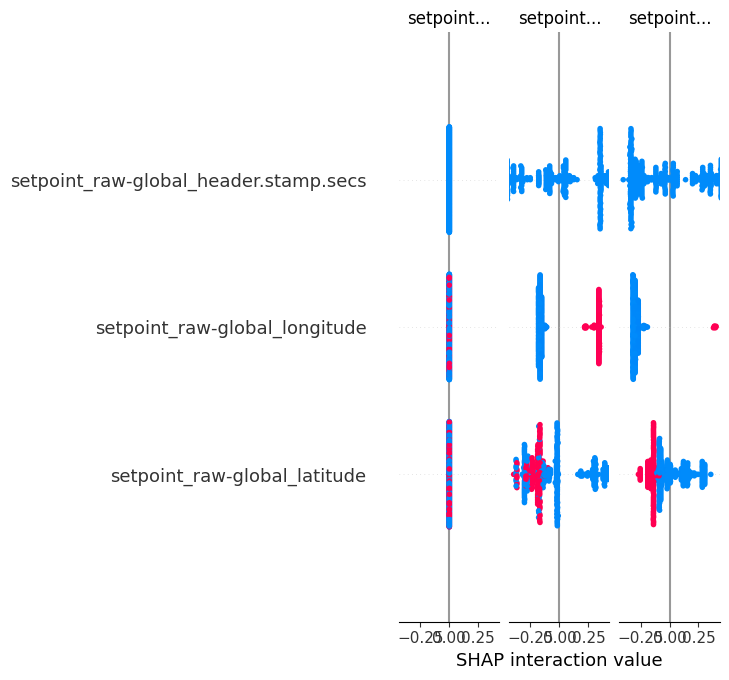

In [81]:
import shap
# SHAP scaffold: explain RF and XGBoost models


if shap is not None:
    explainer_rf = shap.TreeExplainer(rf)
    sv = explainer_rf.shap_values(X_train_scaled[:500]) if X_train_scaled.shape[0] > 0 else None
    print('Computed SHAP (sample) for RF — use summary_plot to visualize')
    if sv is not None:
        shap.summary_plot(sv, X_train.iloc[:500], feature_names=X.columns)